<a href="https://colab.research.google.com/github/Hsayed1/Live-Housing-Market-Analysis-and-Price-Predictions/blob/main/Live_Housing_Market_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Setup**


1.   For Zillow Web Scrapper
*   Create an account or sign in at [scrappeak](https://app.scrapeak.com/login/)
*   After logged in, go to "Plans" and select "Try for free"
*   Go to "Scrapers" then "try for free" on the Zillow Scrapper API
*   Click on "API and Documentation tab" and copy your API key
*   Paste the API key into the second code cell

2.   For Kaggle Data
*   Go to [New York housing Market](https://www.kaggle.com/datasets/nelgiriyewithana/new-york-housing-market) and click download
*   Extract the contents of the zip file
* Run the first code cell and choose NY-House-Dataset.csv to upload






In [ ]:
from google.colab import files
uploaded = files.upload()

Saving NY-House-Dataset.csv to NY-House-Dataset (2).csv


In [ ]:
api_key = ##ENTER YOUR KEY

In [ ]:
import pandas as pd
import requests

def get_listings(api_key, listing_url):
    url = "https://app.scrapeak.com/v1/scrapers/zillow/listing"
    query = {
        "api_key": api_key,
        "url": listing_url
    }
    response = requests.get(url, params=query)
    if response.status_code == 200:
        return response.json()
    else:
        print("There was an error getting listings:", response.status_code)
        return None

#Top 10 counties by population
listing_urls = {
    'Bronx County': "https://www.zillow.com/bronx-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A40.94680121590615%2C%22south%22%3A40.7564476433092%2C%22east%22%3A-73.71150132177735%2C%22west%22%3A-73.97036667822266%7D%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%7D%2C%22isListVisible%22%3Atrue%2C%22mapZoom%22%3A12%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A401%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Kings County': "https://www.zillow.com/kings-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A40.74071482663357%2C%22south%22%3A40.5497695623109%2C%22east%22%3A-73.81556482177734%2C%22west%22%3A-74.07443017822266%7D%2C%22mapZoom%22%3A12%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A581%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Richmond County': "https://www.zillow.com/richmond-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A40.66018195862355%2C%22south%22%3A40.46900615127923%2C%22east%22%3A-74.01738582177735%2C%22west%22%3A-74.27625117822267%7D%2C%22mapZoom%22%3A12%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A2511%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Queens County': "https://www.zillow.com/queens-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A40.84186792581365%2C%22south%22%3A40.46001131103432%2C%22east%22%3A-73.6123266435547%2C%22west%22%3A-74.13005735644532%7D%2C%22mapZoom%22%3A11%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A1347%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Albany County': "https://www.zillow.com/albany-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A42.984492055638405%2C%22south%22%3A42.2437018595693%2C%22east%22%3A-73.45308178710937%2C%22west%22%3A-74.48854321289062%7D%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A823%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Suffolk County': "https://www.zillow.com/suffolk-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A41.679672373857564%2C%22south%22%3A40.15850551079559%2C%22east%22%3A-71.60198657421877%2C%22west%22%3A-73.67290942578127%7D%2C%22usersSearchTerm%22%3A%22Bronx%20County%2C%20NY%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A2046%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%2C%22mapZoom%22%3A9%7D",
    'Nassau County': "https://www.zillow.com/nassau-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A41.13533703306339%2C%22south%22%3A40.37281595345411%2C%22east%22%3A-73.08399228710937%2C%22west%22%3A-74.11945371289062%7D%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A1252%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Westchester County': "https://www.zillow.com/westchester-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A41.497582304974124%2C%22south%22%3A40.73925531385995%2C%22east%22%3A-73.21526578710939%2C%22west%22%3A-74.25072721289064%7D%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A3148%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Erie County': "https://www.zillow.com/erie-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A43.137593139516284%2C%22south%22%3A42.398637678319965%2C%22east%22%3A-78.36936028710936%2C%22west%22%3A-79.40482171289061%7D%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A157%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D",
    'Monroe County': "https://www.zillow.com/monroe-county-ny/?searchQueryState=%7B%22isMapVisible%22%3Atrue%2C%22mapBounds%22%3A%7B%22north%22%3A43.65227916756176%2C%22south%22%3A42.91953091515943%2C%22east%22%3A-77.16659628710939%2C%22west%22%3A-78.20205771289064%7D%2C%22usersSearchTerm%22%3A%22Tampa%2C%20FL%22%2C%22filterState%22%3A%7B%22sort%22%3A%7B%22value%22%3A%22globalrelevanceex%22%7D%2C%22cmsn%22%3A%7B%22value%22%3Afalse%7D%2C%22land%22%3A%7B%22value%22%3Afalse%7D%2C%22ah%22%3A%7B%22value%22%3Atrue%7D%2C%22apa%22%3A%7B%22value%22%3Afalse%7D%2C%22manu%22%3A%7B%22value%22%3Afalse%7D%2C%22built%22%3A%7B%22min%22%3A1940%2C%22max%22%3Anull%7D%2C%22doz%22%3A%7B%22value%22%3A%2290%22%7D%7D%2C%22isListVisible%22%3Atrue%2C%22regionSelection%22%3A%5B%7B%22regionId%22%3A1223%2C%22regionType%22%3A4%7D%5D%2C%22pagination%22%3A%7B%7D%7D"

}

#store DataFrames for each county
dfs = []

# Loop through url dictionary
for county, url in listing_urls.items():

    listing_response = get_listings(api_key, url) #fetch listings
    if listing_response:
        data = listing_response.get("data", {}).get("cat1", {}).get("searchResults", {}).get("mapResults", []) #idea inspired from https://youtu.be/bcZe01LhdFc?si=lMiEJeQTA-OSX9am
        if data:
            df_listings = pd.DataFrame(data)
            df_listings['County'] = county
            dfs.append(df_listings)


We now have our final df with all the listings scraped

In [ ]:
# combine all dataframes
scraped = pd.concat(dfs, ignore_index=True)
scraped.head(1)

,plid,imgSrc,hasImage,detailUrl,statusType,statusText,price,address,minBeds,minBaths,...,availabilityDate,streetViewURL,streetViewMetadataURL,County,communityName,builderName,isCdpResult,style,isComingSoonCommunity,isPropertyResultCDP
0,1712865,https://photos.zillowstatic.com/fp/34c6697cae8...,True,/b/3131-grand-concourse-bronx-ny-5YGDKN/,FOR_SALE,For Rent,"From $135,000","3131 Grand Concourse, Bronx, NY",0.0,1.0,...,NaN,NaN,NaN,Bronx County,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Save DataFrame as a CSV file
scraped.to_csv('scraped_data.csv', index=False)

Lets look at our columns

In [ ]:
scraped.columns

Index(['plid', 'imgSrc', 'hasImage', 'detailUrl', 'statusType', 'statusText',
       'price', 'address', 'minBeds', 'minBaths', 'minArea', 'lotId',
       'latLong', 'variableData', 'badgeInfo', 'buildingId', 'isBuilding',
       'canSaveBuilding', 'has3DModel', 'isHomeRec',
       'hasAdditionalAttributions', 'isFeaturedListing', 'isShowcaseListing',
       'listingType', 'isFavorite', 'timeOnZillow', 'unitCount', 'zpid',
       'rawHomeStatusCd', 'marketingStatusSimplifiedCd', 'priceLabel',
       'isNewYorkState', 'beds', 'baths', 'area', 'hdpData',
       'isUserClaimingOwner', 'isUserConfirmedClaim', 'pgapt', 'sgapt',
       'shouldShowZestimateAsPrice', 'hasVideo', 'visited', 'info3String',
       'brokerName', 'buildingName', 'availabilityDate', 'streetViewURL',
       'streetViewMetadataURL', 'County', 'communityName', 'builderName',
       'isCdpResult', 'style', 'isComingSoonCommunity', 'isPropertyResultCDP'],
      dtype='object')

We will only select a few columns we want

In [ ]:
selected_columns = ['statusText', 'price', 'beds', 'baths', 'area', 'County', 'address', 'latLong']
scraped = scraped[selected_columns]
scraped.head()

,statusText,price,beds,baths,area,County,address,latLong
0,For Rent,"From $135,000",NaN,NaN,NaN,Bronx County,"3131 Grand Concourse, Bronx, NY","{'latitude': 40.875168, 'longitude': -73.886795}"
1,House for sale,"$605,000",4.0,2.0,1620.0,Bronx County,"250 Swinton Avenue, Bronx, NY 10465","{'latitude': 40.81621, 'longitude': -73.81945}"
2,Condo for sale,"$295,000",2.0,2.0,1132.0,Bronx County,"704 Brook Avenue UNIT 3S, Bronx, NY 10455","{'latitude': 40.81902, 'longitude': -73.91242}"
3,Surrey,"From $139,000",NaN,NaN,NaN,Bronx County,"836 Tilden St, Bronx, NY","{'latitude': 40.876614, 'longitude': -73.860374}"
4,House for sale,"$400,000",3.0,2.0,2048.0,Bronx County,"1053 Swinton Ave, Bronx, NY 10465","{'latitude': 40.830513, 'longitude': -73.83101}"


In [ ]:
scraped.dropna(inplace=True)

<ipython-input-8-b84acdd64baf>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scraped.dropna(inplace=True)


In [ ]:
scraped.statusText.value_counts()

statusText
House for sale                1609
Condo for sale                 662
Multi-family home for sale     403
Townhouse for sale             169
New construction               145
Active                         110
Foreclosure                     40
Auction                          9
For sale by owner                3
Name: count, dtype: int64

Lets clean out some of the housing types

In [ ]:
categories_to_drop = ['New construction', 'Active', 'Foreclosure', 'For sale by owner', 'Auction']
scraped = scraped[~scraped['statusText'].isin(categories_to_drop)]
scraped.statusText.value_counts()

statusText
House for sale                1609
Condo for sale                 662
Multi-family home for sale     403
Townhouse for sale             169
Name: count, dtype: int64

convert our prices to floats

In [ ]:
scraped['price'] = scraped['price'].str.replace('$', '').str.replace(',', '').astype(float)

In [ ]:
scraped.head(1)

,statusText,price,beds,baths,area,County,address,latLong
1,House for sale,605000.0,4.0,2.0,1620.0,Bronx County,"250 Swinton Avenue, Bronx, NY 10465","{'latitude': 40.81621, 'longitude': -73.81945}"


Extract the city from our address column

In [ ]:
scraped['CITY'] = scraped['address'].str.split(',').str[1];
scraped.CITY.value_counts()

CITY
 Staten Island    468
 Brooklyn         348
 Bronx            258
 Buffalo           97
 Rochester         95
                 ... 
 Albany             1
 Far Rockaway       1
 Setauket           1
 Remsenburg         1
 Sunnyside          1
Name: count, Length: 337, dtype: int64

Extract longitude and latitude since it is stored as key value pair

In [ ]:
scraped['LATITUDE'] = scraped['latLong'].apply(lambda x: x['latitude'])
scraped['LONGITUDE'] = scraped['latLong'].apply(lambda x: x['longitude'])

In [ ]:
scraped.drop(columns=['latLong', 'address'], inplace=True)

In [ ]:
scraped.rename(columns={'statusText': 'TYPE', 'price': 'PRICE', 'beds': 'BEDS', 'baths': 'BATHS', 'area': 'PROPERTYSQFT', 'County': 'COUNTY'}, inplace=True)

In [ ]:
scraped['SOURCE'] = 'Zillow web scrape'

Drop rows where area is 0

In [ ]:
scraped = scraped[scraped['PROPERTYSQFT'] > 0]

In [ ]:
scraped.head(3)

,TYPE,PRICE,BEDS,BATHS,PROPERTYSQFT,COUNTY,CITY,LATITUDE,LONGITUDE,SOURCE
1,House for sale,605000.0,4.0,2.0,1620.0,Bronx County,Bronx,40.816210,-73.81945,Zillow web scrape
2,Condo for sale,295000.0,2.0,2.0,1132.0,Bronx County,Bronx,40.819020,-73.91242,Zillow web scrape
4,House for sale,400000.0,3.0,2.0,2048.0,Bronx County,Bronx,40.830513,-73.83101,Zillow web scrape


# Examining our CSV Data from Kaggle

In [ ]:
housing=pd.read_csv('/content/NY-House-Dataset.csv')
housing.tail()

,BROKERTITLE,TYPE,PRICE,BEDS,BATH,PROPERTYSQFT,ADDRESS,STATE,MAIN_ADDRESS,ADMINISTRATIVE_AREA_LEVEL_2,LOCALITY,SUBLOCALITY,STREET_NAME,LONG_NAME,FORMATTED_ADDRESS,LATITUDE,LONGITUDE
4796,Brokered by COMPASS,Co-op for sale,599000,1,1.0,2184.207862,222 E 80th St Apt 3A,"Manhattan, NY 10075","222 E 80th St Apt 3AManhattan, NY 10075",New York,New York County,New York,Manhattan,222,"222 E 80th St #3a, New York, NY 10075, USA",40.774350,-73.955879
4797,Brokered by Mjr Real Estate Llc,Co-op for sale,245000,1,1.0,2184.207862,97-40 62 Dr Unit Lg,"Rego Park, NY 11374","97-40 62 Dr Unit LgRego Park, NY 11374",United States,New York,Queens County,Queens,62nd Drive,"97-40 62nd Dr, Rego Park, NY 11374, USA",40.732538,-73.860152
4798,Brokered by Douglas Elliman - 575 Madison Ave,Co-op for sale,1275000,1,1.0,2184.207862,427 W 21st St Unit Garden,"New York, NY 10011","427 W 21st St Unit GardenNew York, NY 10011",United States,New York,New York County,New York,West 21st Street,"427 W 21st St, New York, NY 10011, USA",40.745882,-74.003398
4799,Brokered by E Realty International Corp,Condo for sale,598125,2,1.0,655.000000,91-23 Corona Ave Unit 4G,"Elmhurst, NY 11373","91-23 Corona Ave Unit 4GElmhurst, NY 11373",New York,Queens County,Queens,Flushing,91-23,"91-23 Corona Ave. #4b, Flushing, NY 11373, USA",40.742770,-73.872752
4800,Brokered by Nyc Realty Brokers Llc,Co-op for sale,349000,1,1.0,750.000000,460 Neptune Ave Apt 14O,"Brooklyn, NY 11224","460 Neptune Ave Apt 14OBrooklyn, NY 11224",New York,Kings County,Brooklyn,Coney Island,460,"460 Neptune Ave #14a, Brooklyn, NY 11224, USA",40.579147,-73.970949


In [ ]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4801 entries, 0 to 4800
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   BROKERTITLE                  4801 non-null   object 
 1   TYPE                         4801 non-null   object 
 2   PRICE                        4801 non-null   int64  
 3   BEDS                         4801 non-null   int64  
 4   BATH                         4801 non-null   float64
 5   PROPERTYSQFT                 4801 non-null   float64
 6   ADDRESS                      4801 non-null   object 
 7   STATE                        4801 non-null   object 
 8   MAIN_ADDRESS                 4801 non-null   object 
 9   ADMINISTRATIVE_AREA_LEVEL_2  4801 non-null   object 
 10  LOCALITY                     4801 non-null   object 
 11  SUBLOCALITY                  4801 non-null   object 
 12  STREET_NAME                  4801 non-null   object 
 13  LONG_NAME         

In [ ]:
housing.shape

(4801, 17)

In [ ]:
housing.duplicated().sum()

214

We can see that there are some duplicates so we will remove all the duplicate rows in the next cell

In [ ]:
housing.drop_duplicates(inplace=True)
housing.duplicated().sum()

0

We will check for null values

In [ ]:
housing.isnull().sum()

BROKERTITLE                    0
TYPE                           0
PRICE                          0
BEDS                           0
BATH                           0
PROPERTYSQFT                   0
ADDRESS                        0
STATE                          0
MAIN_ADDRESS                   0
ADMINISTRATIVE_AREA_LEVEL_2    0
LOCALITY                       0
SUBLOCALITY                    0
STREET_NAME                    0
LONG_NAME                      0
FORMATTED_ADDRESS              0
LATITUDE                       0
LONGITUDE                      0
dtype: int64

There are no null values in our dataset

## Lets examine some of our categorical variables and the different types within them


In [ ]:
housing.BROKERTITLE.value_counts()

BROKERTITLE
Brokered by COMPASS                                      435
Brokered by Douglas Elliman - 575 Madison Ave            109
Brokered by Brown Harris Stevens                          93
Brokered by Corcoran East Side                            86
Brokered by RE MAX Edge                                   75
                                                        ... 
Brokered by Grandeur Realty, Inc.                          1
Brokered by Eva Real Estate LLC                            1
Brokered by Cruz Network The Bronx Realty                  1
Brokered by Howard Hanna Coach Realtors - Floral Park      1
Brokered by New York Way Real Estate Corp                  1
Name: count, Length: 1036, dtype: int64

There are 976 different broker titles in this dataset

In [ ]:
housing.TYPE.value_counts()

TYPE
Co-op for sale                1388
House for sale                 966
Condo for sale                 842
Multi-family home for sale     699
Townhouse for sale             288
Pending                        229
Contingent                      87
Land for sale                   47
For sale                        20
Foreclosure                     14
Condop for sale                  4
Coming Soon                      2
Mobile house for sale            1
Name: count, dtype: int64

We can see the different types of houses for sale within our dataset. Some of the types do not make much sense. We can go ahead and drop 'Coming soon', 'Foreclosure', 'For sale', 'Land for sale', 'Contingent', and 'Pending'. We can also go ahead and drop mobile house and condop since we do not have enough data to reperesent those categories. These data points constitute for around 6% of our original dataset

In [ ]:
# List of categories to drop
categories_to_drop = ['Coming Soon', 'Foreclosure', 'For sale', 'Land for sale', 'Contingent', 'Pending', 'Mobile house for sale', 'Condop for sale']
housing = housing[~housing['TYPE'].isin(categories_to_drop)]
housing.TYPE.value_counts()

TYPE
Co-op for sale                1388
House for sale                 966
Condo for sale                 842
Multi-family home for sale     699
Townhouse for sale             288
Name: count, dtype: int64

In [ ]:
housing.STATE.value_counts()

STATE
Brooklyn, NY 11235         91
Brooklyn, NY 11209         84
Forest Hills, NY 11375     83
Brooklyn, NY 11234         82
Staten Island, NY 10314    70
                           ..
Flushing, NY 11357          1
Ny, NY 10017                1
Queens, NY 11427            1
Queens, NY 11429            1
Ozone Park, NY 11416        1
Name: count, Length: 297, dtype: int64

Here we can see the many different types of states in our state column. There are a 308 different states and it wouldn't make much sense to plot them all. Something interesting to note is the state includes the city as a part of its substring. We can look to perform some feature engineering and extract a city column from this state column

In [ ]:
housing.ADMINISTRATIVE_AREA_LEVEL_2.value_counts()

ADMINISTRATIVE_AREA_LEVEL_2
United States      2114
New York           1999
New York County      20
11214                 8
Queens County         6
Kings County          6
Bronx County          4
11229                 3
10017                 2
10003                 2
10002                 2
10471                 2
11237                 1
10466                 1
Brooklyn              1
10465                 1
10312                 1
10306                 1
10309                 1
10303                 1
10463                 1
10301                 1
10304                 1
11417                 1
10310                 1
11234                 1
11218                 1
Name: count, dtype: int64

Here we have the adminstrative areas displayed. We can see that some of the values are displayed as the zip code rather than the name of the area. We can map these zip codes to their appropriate city later on or see if another column already has the information for us

In [ ]:
housing.LOCALITY.value_counts()

LOCALITY
New York           2134
New York County     866
Queens County       515
Kings County        405
Bronx County        167
Richmond County      46
United States        33
Brooklyn              6
Queens                6
The Bronx             4
Flatbush              1
Name: count, dtype: int64

It seems like this column gives us more clearer information from the one above so it may not be necessary to map the zip codes

In [ ]:
housing.SUBLOCALITY.value_counts()

SUBLOCALITY
New York            899
Kings County        627
Queens County       594
Queens              513
Brooklyn            405
Richmond County     362
Bronx County        274
New York County     257
The Bronx           169
Staten Island        46
Manhattan            20
Flushing              4
Coney Island          3
Riverdale             3
East Bronx            1
Brooklyn Heights      1
Jackson Heights       1
Rego Park             1
Fort Hamilton         1
Dumbo                 1
Snyder Avenue         1
Name: count, dtype: int64

In [ ]:
housing.STREET_NAME.value_counts()

STREET_NAME
Manhattan        866
Brooklyn         627
Queens           594
Staten Island    362
The Bronx        277
                ... 
Arverne            1
Rector Place       1
Centre Street      1
Clason Point       1
Maspeth            1
Name: count, Length: 168, dtype: int64

In [ ]:
housing.LONG_NAME.value_counts()

LONG_NAME
200                  18
2                    17
100                  16
50                   15
40                   14
                     ..
Wainwright Avenue     1
1793                  1
31-21                 1
South Avenue          1
2351                  1
Name: count, Length: 2552, dtype: int64

In [ ]:
housing.FORMATTED_ADDRESS.value_counts()

FORMATTED_ADDRESS
61-20 Grand Central Pkwy, Forest Hills, NY 11375, USA    3
120 Queens Blvd #98, Rego Park, NY 11374, USA            3
67-66 108th St, Forest Hills, NY 11375, USA              3
141 E 63rd St, New York, NY 10065, USA                   2
Tudor City, New York, NY 10017, USA                      2
                                                        ..
86-2 Dumont Ave #1b, Ozone Park, NY 11417, USA           1
579 W 215th St #9d, New York, NY 10034, USA              1
146-06 13th Ave, Flushing, NY 11357, USA                 1
158 Franklin St FL 3, New York, NY 10013, USA            1
460 Neptune Ave #14a, Brooklyn, NY 11224, USA            1
Name: count, Length: 4150, dtype: int64

In [ ]:
housing.BATH.value_counts()

BATH
2.000000     1451
1.000000     1352
4.000000      419
3.000000      419
2.373861      219
6.000000      128
5.000000       90
8.000000       43
7.000000       21
10.000000      15
9.000000        6
16.000000       5
20.000000       3
12.000000       3
11.000000       2
24.000000       1
0.000000        1
43.000000       1
32.000000       1
50.000000       1
13.000000       1
17.000000       1
Name: count, dtype: int64

We have many bathrooms that are 2.37. This could be a user mistake when inputting the data. We will round these values up to 2.5 to represent 2.5 bath

In [ ]:
def roundUp(p):
  if 2.3< p <2.4:
    return 2.5
  else:
    return p
fixedBaths = housing.BATH.map(roundUp)

housing['BATH'] = fixedBaths
housing.BATH.value_counts()

BATH
2.0     1451
1.0     1352
4.0      419
3.0      419
2.5      219
6.0      128
5.0       90
8.0       43
7.0       21
10.0      15
9.0        6
16.0       5
20.0       3
12.0       3
11.0       2
24.0       1
0.0        1
43.0       1
32.0       1
50.0       1
13.0       1
17.0       1
Name: count, dtype: int64

In [ ]:
housing.BEDS.value_counts()

BEDS
3     1228
2      880
1      729
4      495
5      312
6      236
7       94
8       75
9       37
12      21
10      21
11      19
14       6
15       5
13       5
16       4
20       3
24       3
32       2
35       1
50       1
36       1
42       1
40       1
30       1
19       1
18       1
Name: count, dtype: int64

### After reviewing our columns we are going to perform the following tasks:


1.   Extract city from state column and put it into its own city column
2.   Clean unusual housing types (already done)
3.   Clean locality entries; ex: New york and New york county should be the same thing
4. Round 2.37 bathrooms to 2.5 (already done)
5.   Drop unwanted columns
6.   Convert our int data types to float since seaborn handles floats better



In [ ]:
housing['CITY'] = housing['STATE'].str.split(',').str[0];
housing.CITY.value_counts()

CITY
Brooklyn                     1029
New York                      771
Bronx                         446
Staten Island                 412
Manhattan                     374
                             ... 
Roosevelt Island                1
Bronx Ny                        1
Belle Harbor                    1
Ditmas Park                     1
Prospect Lefferts Gardens       1
Name: count, Length: 68, dtype: int64

After creating our city column we can see that there are 68 unique citys in our dataset

We are now going to clean up the locality column. We are using this site by the new york government as our reference [new york counties](https://portal.311.nyc.gov/article/?kanumber=KA-02877)

In [ ]:
# Define the mapping dictionary
counties = {
    'Bronx County': 'Bronx County',
    'The Bronx': 'Bronx County',
    'Flatbush': 'Kings County',     ##Flatbush is a part of kings county
    'Kings County': 'Kings County',
    'New York County': 'New York County',
    'New York': 'New York County',
    'Brooklyn': 'Queens County',
    'Queens': 'Queens County',
    'Queens County': 'Queens County',
    'Richmond County': 'Richmond County',
    'United States': 'United States'


}


# Map the localities to their respective counties
housing['LOCALITY'] = housing['LOCALITY'].map(counties)


In [ ]:
housing.LOCALITY.value_counts()

LOCALITY
New York County    3000
Queens County       527
Kings County        406
Bronx County        171
Richmond County      46
United States        33
Name: count, dtype: int64

Within some of our localities there appears to be 33 values which have been inputed as United States for some reason. Lets take a look at those rows, specifically the cities which we have extracted from the state column

In [ ]:
us_housing = housing[housing['LOCALITY'] == 'United States']
us_housing.CITY.value_counts()

CITY
Brooklyn         14
Staten Island     7
New York          6
Bronx             5
Queens            1
Name: count, dtype: int64

As we can see many of these cities we have already mapped to a locality in the previous step. We can further map our localities that are labeled as United states by looking at its city and assigning it to the appropriate locality

In [ ]:
# Mapping dictionary for LOCALITY based on CITY values
city_to_county = {
    'Brooklyn': 'Queens County',
    'Staten Island': 'Richmond County',
    'New York': 'New York County',
    'Bronx': 'Bronx County',
    'Queens': 'Queens County'
}

# Update 'LOCALITY' based on 'CITY'
housing.loc[housing['LOCALITY'] == 'United States', 'LOCALITY'] = housing.loc[housing['LOCALITY'] == 'United States', 'CITY'].map(city_to_county)

housing.LOCALITY.value_counts()


LOCALITY
New York County    3006
Queens County       542
Kings County        406
Bronx County        176
Richmond County      53
Name: count, dtype: int64

Now we can drop the columns we mentioned and convert our int types to float

In [ ]:
droppable = ['STATE', 'MAIN_ADDRESS','ADMINISTRATIVE_AREA_LEVEL_2', 'LONG_NAME', 'FORMATTED_ADDRESS', 'ADDRESS', 'BROKERTITLE', 'SUBLOCALITY', 'STREET_NAME']
housing.drop(columns=droppable, inplace=True)

convert = ['BEDS', 'PRICE']

housing[convert] = housing[convert].astype(float)
housing.rename(columns={'LOCALITY': 'COUNTY', 'BATH' : 'BATHS'}, inplace=True)
housing.info()
housing.head(2)

<class 'pandas.core.frame.DataFrame'>
Index: 4183 entries, 0 to 4800
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TYPE          4183 non-null   object 
 1   PRICE         4183 non-null   float64
 2   BEDS          4183 non-null   float64
 3   BATHS         4183 non-null   float64
 4   PROPERTYSQFT  4183 non-null   float64
 5   COUNTY        4183 non-null   object 
 6   LATITUDE      4183 non-null   float64
 7   LONGITUDE     4183 non-null   float64
 8   CITY          4183 non-null   object 
dtypes: float64(6), object(3)
memory usage: 326.8+ KB


,TYPE,PRICE,BEDS,BATHS,PROPERTYSQFT,COUNTY,LATITUDE,LONGITUDE,CITY
0,Condo for sale,315000.0,2.0,2.0,1400.0,New York County,40.761255,-73.974483,New York
1,Condo for sale,195000000.0,7.0,10.0,17545.0,New York County,40.766393,-73.980991,New York


In [ ]:
housing['SOURCE'] = 'Kaggle'

**Now lets merge our two datasets**

In [ ]:
housing = pd.merge(housing, scraped, on=['TYPE', 'PRICE', 'BEDS', 'BATHS', 'PROPERTYSQFT', 'COUNTY', 'CITY', 'LATITUDE', 'LONGITUDE', 'SOURCE'], how='outer')

In [ ]:
housing.head()

,TYPE,PRICE,BEDS,BATHS,PROPERTYSQFT,COUNTY,LATITUDE,LONGITUDE,CITY,SOURCE
0,Condo for sale,315000.0,2.0,2.0,1400.0,New York County,40.761255,-73.974483,New York,Kaggle
1,Condo for sale,195000000.0,7.0,10.0,17545.0,New York County,40.766393,-73.980991,New York,Kaggle
2,House for sale,260000.0,4.0,2.0,2015.0,New York County,40.541805,-74.196109,Staten Island,Kaggle
3,Condo for sale,69000.0,3.0,1.0,445.0,New York County,40.761398,-73.974613,Manhattan,Kaggle
4,Townhouse for sale,55000000.0,7.0,2.5,14175.0,New York County,40.767224,-73.969856,New York,Kaggle


In [ ]:
housing.drop_duplicates(inplace=True)

Shape of our new dataset

In [ ]:
housing.shape

(6916, 10)

# Now lets perform some EDA and see if we can find any trends in our data

Lets first examine the differences in our sources of data

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

<ipython-input-51-c617a3e76873>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing,


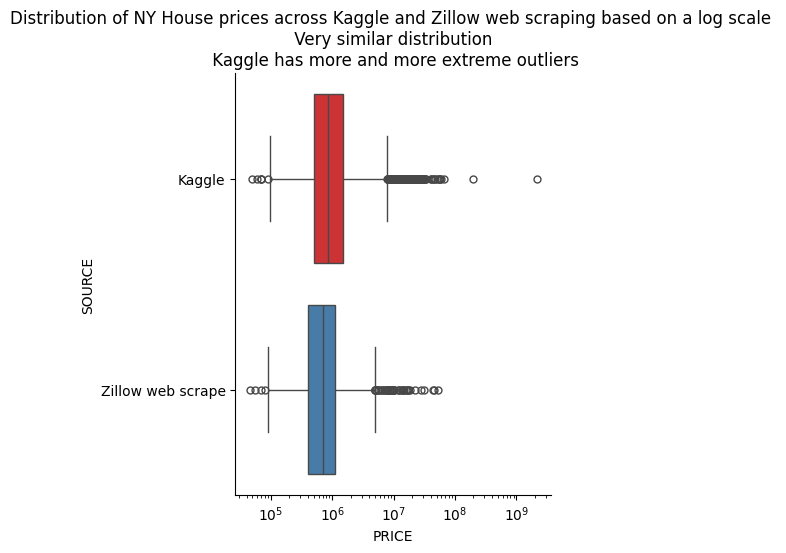

In [ ]:
sns.catplot(data = housing,
            x = 'PRICE',
            y= 'SOURCE',
            kind= 'box',
            log_scale = True,
            palette = 'Set1');
plt.title("Distribution of NY House prices across Kaggle and Zillow web scraping based on a log scale \n Very similar distribution \n Kaggle has more and more extreme outliers");

<ipython-input-52-21db02284ac9>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing,


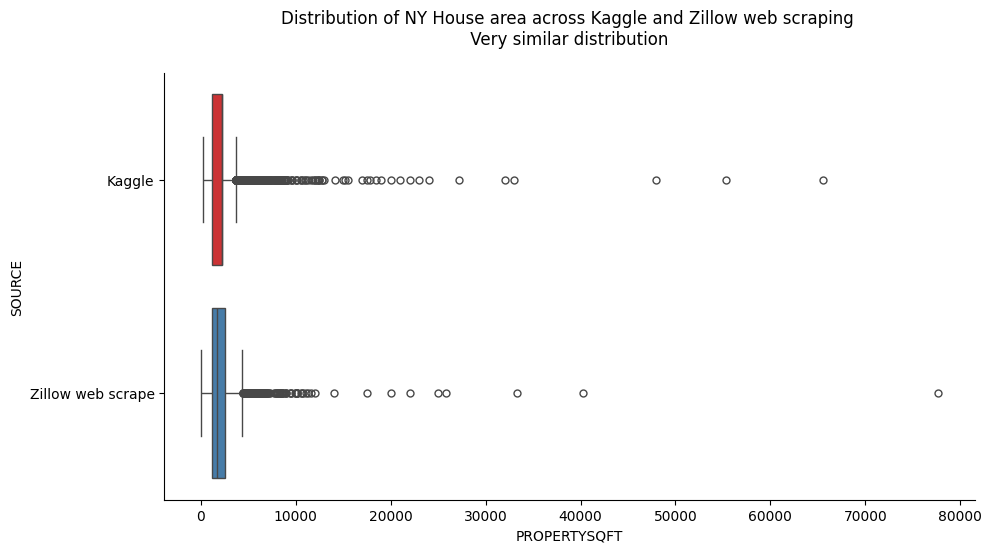

In [ ]:
sns.catplot(data = housing,
            x = 'PROPERTYSQFT',
            y= 'SOURCE',
            kind= 'box',
            aspect = 2,
            palette = 'Set1');
plt.title("Distribution of NY House area across Kaggle and Zillow web scraping \n Very similar distribution \n");

<ipython-input-53-06bbf46816f8>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing,


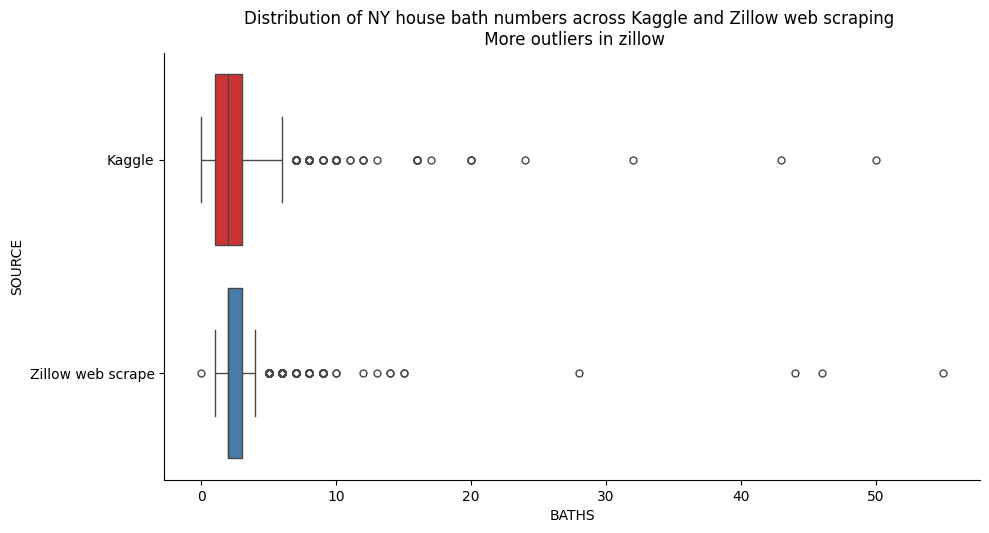

In [ ]:
sns.catplot(data = housing,
            x = 'BATHS',
            y= 'SOURCE',
            kind= 'box',
            aspect = 2,
            palette = 'Set1');
plt.title("Distribution of NY house bath numbers across Kaggle and Zillow web scraping \n More outliers in zillow");

<ipython-input-54-79c95a886ce8>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing,


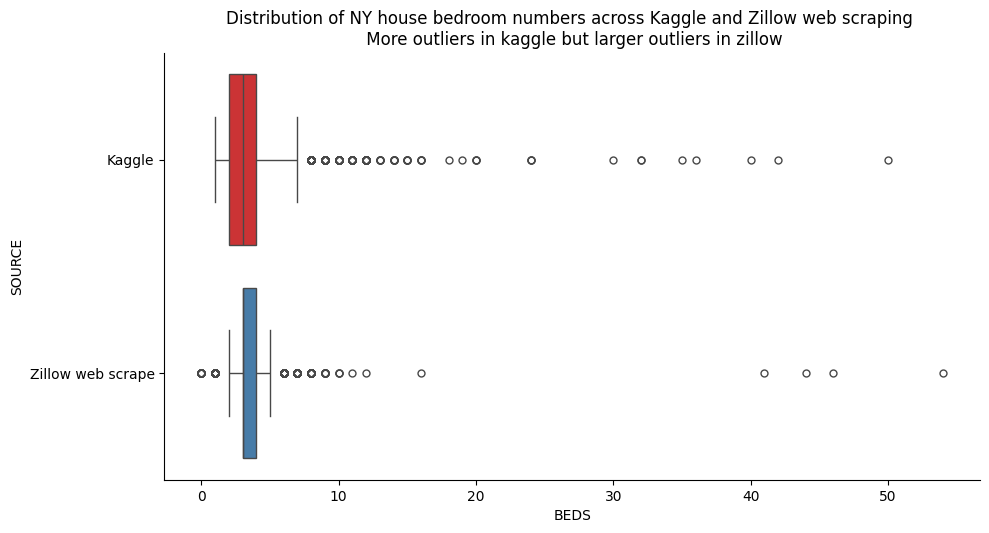

In [ ]:
sns.catplot(data = housing,
            x = 'BEDS',
            y= 'SOURCE',
            kind= 'box',
            aspect = 2,
            palette = 'Set1');
plt.title("Distribution of NY house bedroom numbers across Kaggle and Zillow web scraping \n More outliers in kaggle but larger outliers in zillow");

We will look more into the differences in our sources of data later on

Now lets take a look at our numerical variables

In [ ]:
housing.PRICE.describe()

count    6.916000e+03
mean     1.928201e+06
std      2.615466e+07
min      4.500000e+04
25%      4.599000e+05
50%      7.750000e+05
75%      1.299999e+06
max      2.147484e+09
Name: PRICE, dtype: float64

By just glancing at our summary statistics, we can clearly see a large discrepancy between the mean and the median of house prices and we can expect our data to be skewed right. We will explore this further and determine how to deal with outliers

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Lets take a look at the distribution of some of our numerical variables

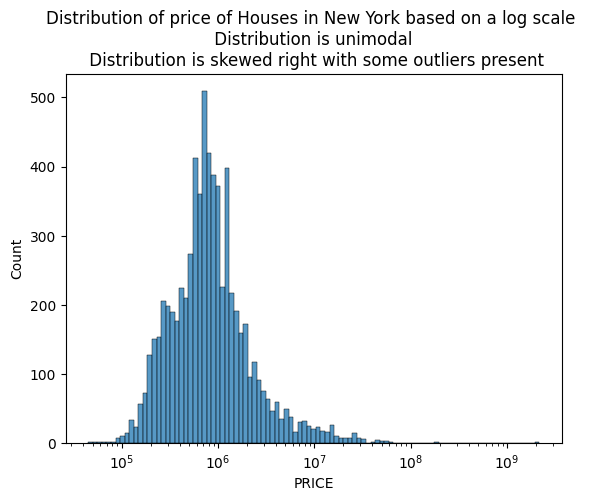

In [ ]:
sns.histplot(data = housing,
             x = 'PRICE',
             log_scale=True);

plt.title("Distribution of price of Houses in New York based on a log scale \n Distribution is unimodal \n Distribution is skewed right with some outliers present");

Our distribution of housing prices appears to be unimodal and extend much further to the right of the median than the left as we expected. In the context of housing prices, this suggests that there is a distinct group or cluster of prices that are more common or have higher frequencies compared to the rest of the prices. Since the prices is skewed to the right it means that there are more housing prices above the median than below it.

Lets take a look of our distribution through a box plot

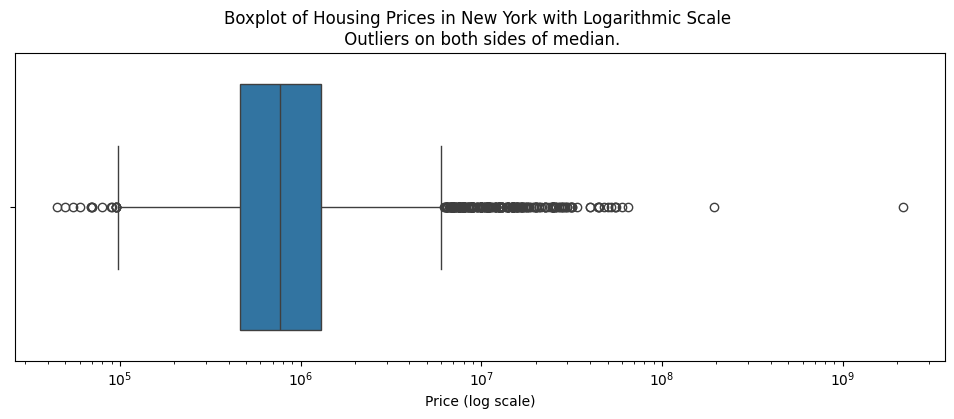

In [ ]:
plt.figure(figsize=(12, 4))
sns.boxplot(data = housing,
            x= 'PRICE',
            log_scale=True);
plt.title("Boxplot of Housing Prices in New York with Logarithmic Scale \n Outliers on both sides of median.");
plt.xlabel("Price (log scale)");

We can see our medium price is just below 10^6. There appears to be many outliers in our dataset, specifcally on the right side of our median. We will further examine these outliers later by looking into the distribution of price based on the type of property being sold

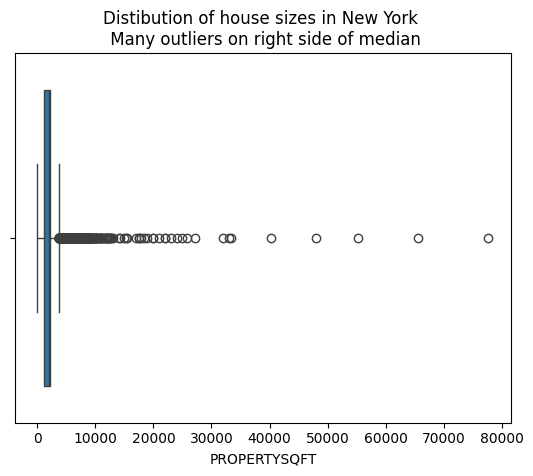

In [ ]:
sns.boxplot(data = housing,
            x= 'PROPERTYSQFT');

plt.title("Distibution of house sizes in New York \n Many outliers on right side of median");

We can see we have many outliers again, we wont touch them for now

In [ ]:
housing.BATHS.describe()

count    6916.000000
mean        2.541136
std         2.088309
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        55.000000
Name: BATHS, dtype: float64

In [ ]:
housing.BATHS.value_counts()

BATHS
2.0     2438
1.0     1794
3.0     1159
4.0      726
5.0      226
2.5      219
6.0      191
8.0       56
7.0       41
9.0       18
10.0      17
16.0       5
12.0       4
20.0       3
14.0       2
0.0        2
15.0       2
11.0       2
13.0       2
24.0       1
43.0       1
17.0       1
46.0       1
55.0       1
44.0       1
28.0       1
32.0       1
50.0       1
Name: count, dtype: int64

We have a lot of bathroom counts that are very high, lets look at them by the source

In [ ]:
baths_counts_by_source = housing.groupby('SOURCE')['BATHS'].value_counts()
baths_counts_by_source

SOURCE             BATHS
Kaggle             2.0      1451
                   1.0      1351
                   3.0       419
                   4.0       419
                   2.5       219
                   6.0       128
                   5.0        90
                   8.0        43
                   7.0        21
                   10.0       15
                   9.0         6
                   16.0        5
                   12.0        3
                   20.0        3
                   11.0        2
                   0.0         1
                   43.0        1
                   50.0        1
                   32.0        1
                   24.0        1
                   17.0        1
                   13.0        1
Zillow web scrape  2.0       987
                   3.0       740
                   1.0       443
                   4.0       307
                   5.0       136
                   6.0        63
                   7.0        20
                  

We have some very high bathroom counts in both sources

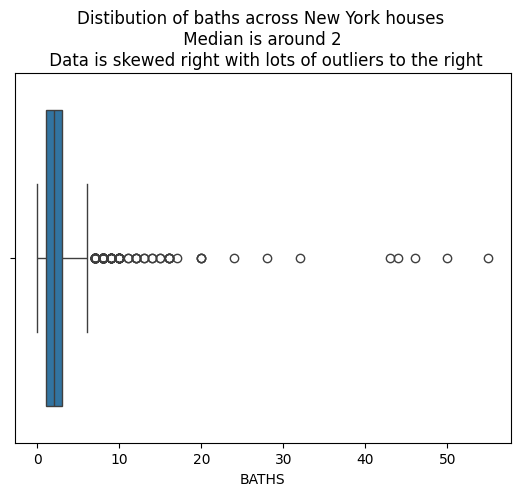

In [ ]:
sns.boxplot(data = housing,
            x= 'BATHS');

plt.title("Distibution of baths across New York houses \n Median is around 2 \n Data is skewed right with lots of outliers to the right");

We have few outliers in our distribution of bathrooms, we will not touch them for now

In [ ]:
housing.BEDS.describe()

count    6916.000000
mean        3.419462
std         2.520606
min         0.000000
25%         2.000000
50%         3.000000
75%         4.000000
max        54.000000
Name: BEDS, dtype: float64

In [ ]:
housing.BEDS.value_counts()

BEDS
3.0     2179
2.0     1353
4.0     1141
1.0      895
5.0      573
6.0      362
7.0      143
8.0      102
9.0       46
10.0      24
12.0      22
11.0      20
0.0       15
14.0       6
13.0       5
15.0       5
16.0       5
20.0       3
24.0       3
32.0       2
44.0       1
54.0       1
46.0       1
19.0       1
18.0       1
35.0       1
30.0       1
40.0       1
42.0       1
36.0       1
50.0       1
41.0       1
Name: count, dtype: int64

In [ ]:
bed_counts_by_source = housing.groupby('SOURCE')['BEDS'].value_counts()
bed_counts_by_source

SOURCE             BEDS
Kaggle             3.0     1227
                   2.0      880
                   1.0      729
                   4.0      495
                   5.0      312
                   6.0      236
                   7.0       94
                   8.0       75
                   9.0       37
                   10.0      21
                   12.0      21
                   11.0      19
                   14.0       6
                   13.0       5
                   15.0       5
                   16.0       4
                   20.0       3
                   24.0       3
                   32.0       2
                   35.0       1
                   50.0       1
                   42.0       1
                   40.0       1
                   36.0       1
                   30.0       1
                   19.0       1
                   18.0       1
Zillow web scrape  3.0      952
                   4.0      646
                   2.0      473
                

Like the bathroom count the bed count distribution is similar across both sources

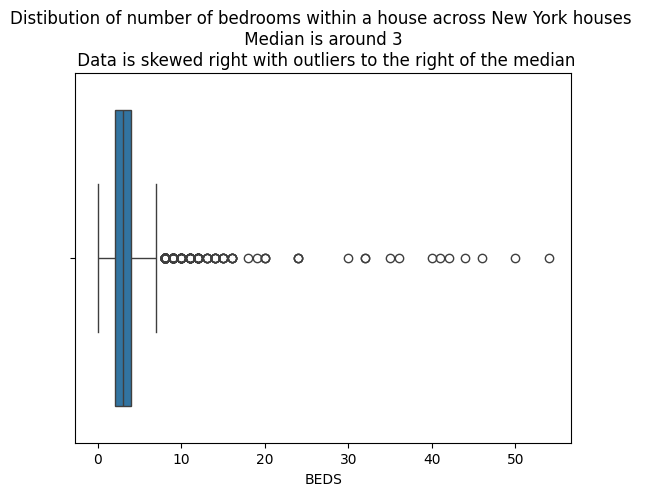

In [ ]:
sns.boxplot(data = housing,
            x= 'BEDS');

plt.title("Distibution of number of bedrooms within a house across New York houses \n Median is around 3 \n Data is skewed right with outliers to the right of the median");

We can see we have few outliers just like our baths, we wont touch them for now

Lets now see the the correlation between some of our numeric variables

We will first explore the relationship between the square feet of a property and the price

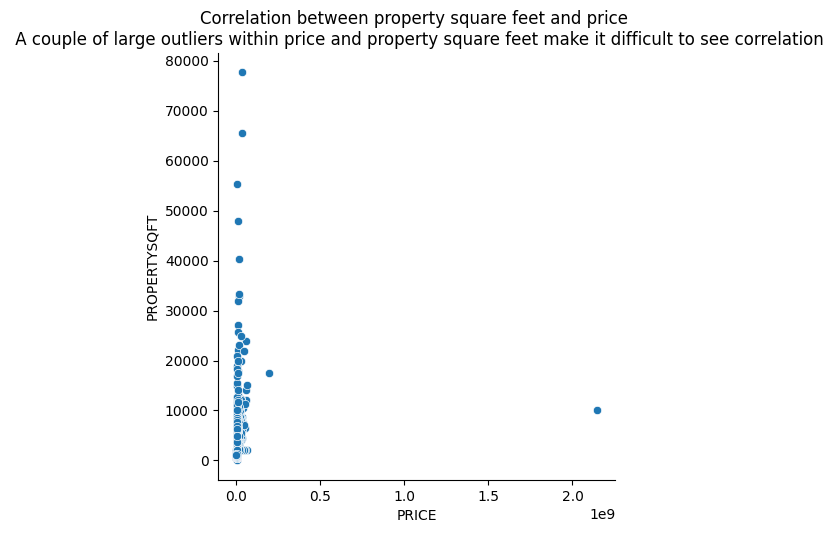

In [ ]:
sns.relplot(data = housing,
            x = 'PRICE',
            y = 'PROPERTYSQFT');
plt.title("Correlation between property square feet and price \n A couple of large outliers within price and property square feet make it difficult to see correlation");

We can see its difficult to see the relationship because of our outliers lets not include them in our plot.

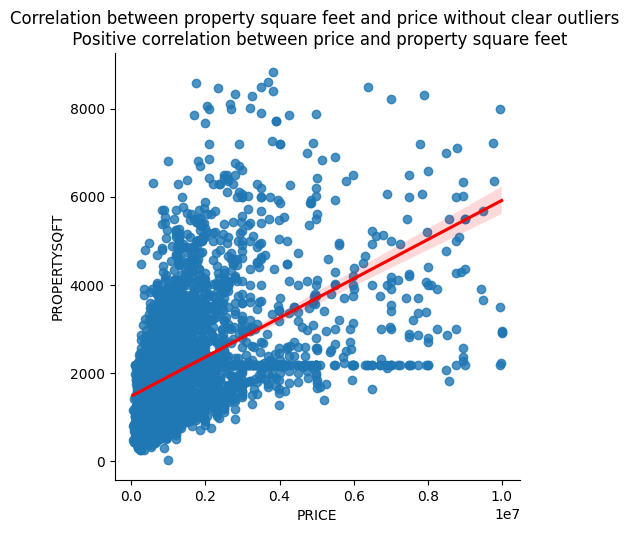

In [ ]:

filtered_housing = housing[(housing['PRICE'] < 1e7) & (housing['PROPERTYSQFT'] < 9000)]

sns.lmplot(data=filtered_housing,
           x='PRICE',
           y='PROPERTYSQFT',
           line_kws={'color': 'red'});
plt.title("Correlation between property square feet and price without clear outliers \n Positive correlation between price and property square feet");

In this line plot we removed outliers on both axis, we filtered our house prices to be under 10 million and our square feet to be under 9000. With these adjustments we can see a clear positive correlation between our house price and our property square feet. Our actual results from the regression our shown below

In [ ]:
from scipy import stats
stats.linregress(filtered_housing.PRICE,filtered_housing.PROPERTYSQFT)

LinregressResult(slope=0.00044403360563263875, intercept=1478.486449847774, rvalue=0.5065586354488997, pvalue=0.0, stderr=9.22715926406735e-06, intercept_stderr=15.529626789428379)

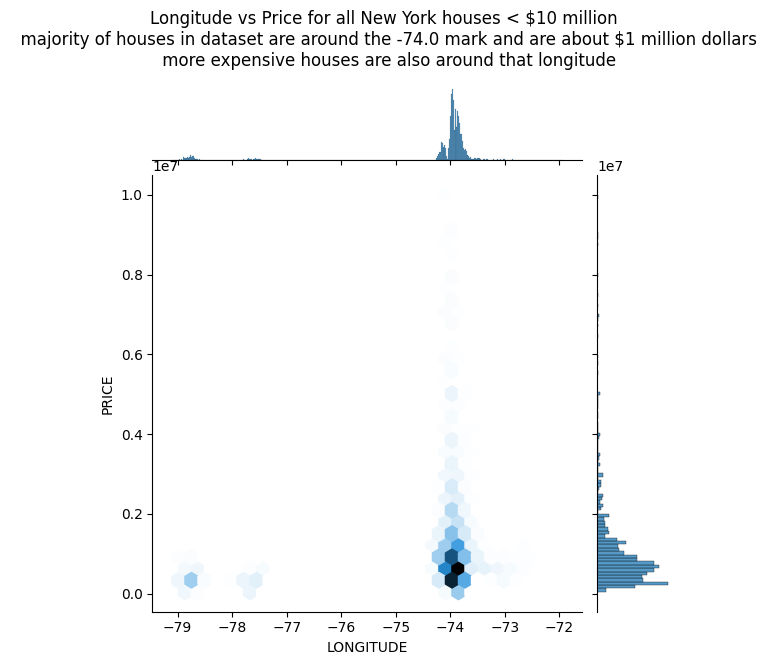

In [ ]:
g=sns.jointplot(
    data=housing[housing['PRICE'] < 1e7],
    y='PRICE',
    x='LONGITUDE',
    kind="hex",
    gridsize=30
)
# Set a super title for the figure
g.fig.suptitle("Longitude vs Price for all New York houses < $10 million \n  majority of houses in dataset are around the -74.0 mark and are about $1 million dollars \n more expensive houses are also around that longitude", y=1.1);


From the hex plot we can see that a majority of our houses are between the -74.0 to -73.9 mark and are about $2 million dollars. Our more expensive houses are also around that longitude

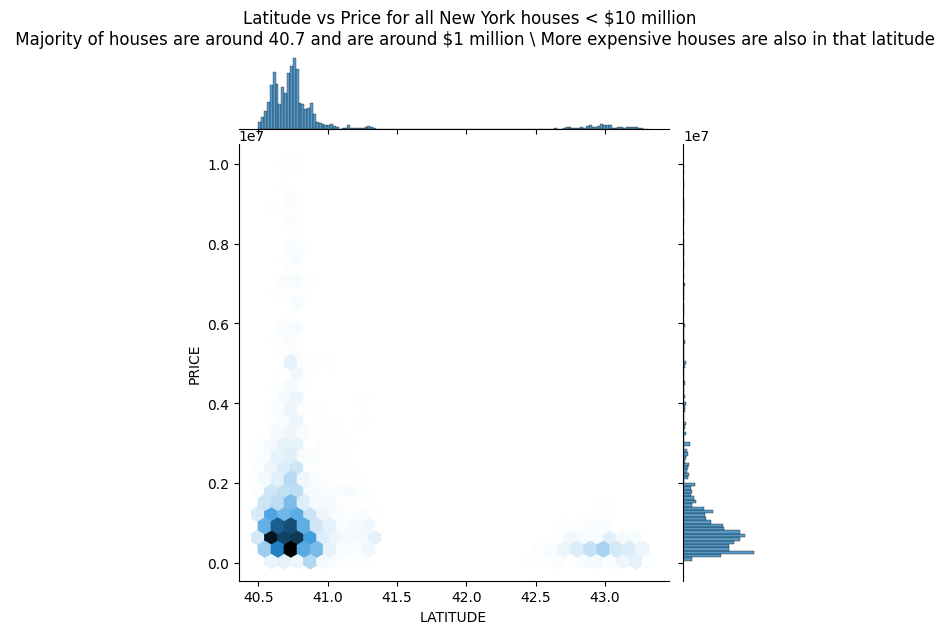

In [ ]:
g=sns.jointplot(
    data=housing[housing['PRICE'] < 1e7],
    y='PRICE',
    x='LATITUDE',
    kind="hex",
    gridsize=30
)
# Set a super title for the figure
g.fig.suptitle("Latitude vs Price for all New York houses < $10 million \n Majority of houses are around 40.7 and are around $1 million \ More expensive houses are also in that latitude", y=1.05);


When it comes to our latitude vs price graph, we can see that the distribution is more spread with the most expensive houses being aorund 40.7 to 40.8

## We can use folium to show our different housing counties on a map of New York

In [ ]:
!pip install folium

In [ ]:
def get_color(county):
    """Assign a color to each county based on its name for folium marker"""

    color_mapping = {
        'New York County': 'blue',
        'Queens County': 'green',
        'Kings County': 'red',
        'Bronx County': 'orange',
        'Westchester County': 'purple',
        'Erie County': 'yellow',
        'Nassau County': 'cyan',
        'Suffolk County': 'magenta',
        'Monroe County': 'lime',
        'Richmond County': 'pink',
        'Albany County': 'teal'
    }

    return color_mapping.get(county)

In [ ]:
# import folium package
import folium
ny = folium.Map(location=[40.7128, -74.0060], zoom_start=6)

for index, row in housing.iterrows():
    latitude = row['LATITUDE']
    longitude = row['LONGITUDE']
    county = row['COUNTY']
    popup = f"{county}, {latitude}, {longitude}"
    color = get_color(county)

    folium.Circle(
        location=[latitude, longitude],
        radius = 20,
        color = color,
        popup=popup).add_to(ny)

ny

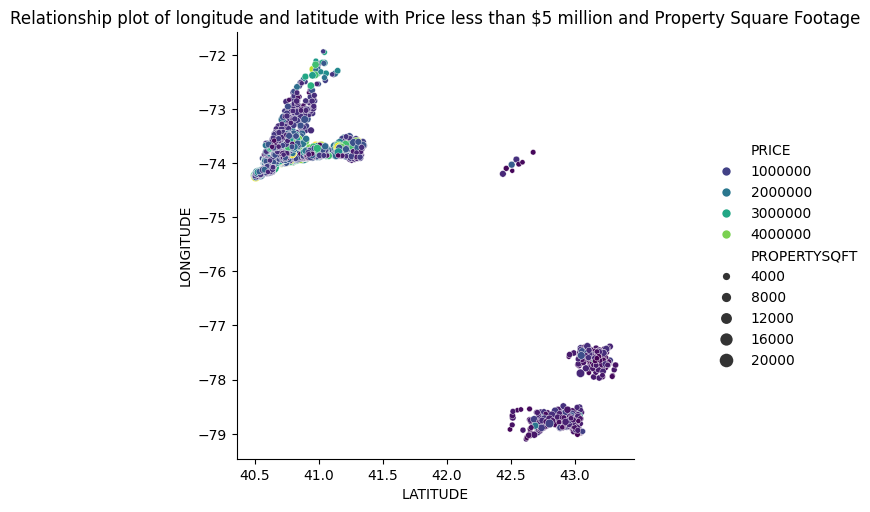

In [ ]:
sns.relplot(data = housing[housing['PRICE'] < 5e6],
            x= 'LATITUDE',
            y = 'LONGITUDE',
            hue = 'PRICE',
            size = 'PROPERTYSQFT',
            palette='viridis',
            sizes = (10,100)
);
plt.title("Relationship plot of longitude and latitude with Price less than $5 million and Property Square Footage");

Now we will explore some of our categorical variables

<ipython-input-77-31dec7c265bb>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing[housing.PRICE  < 1e7],


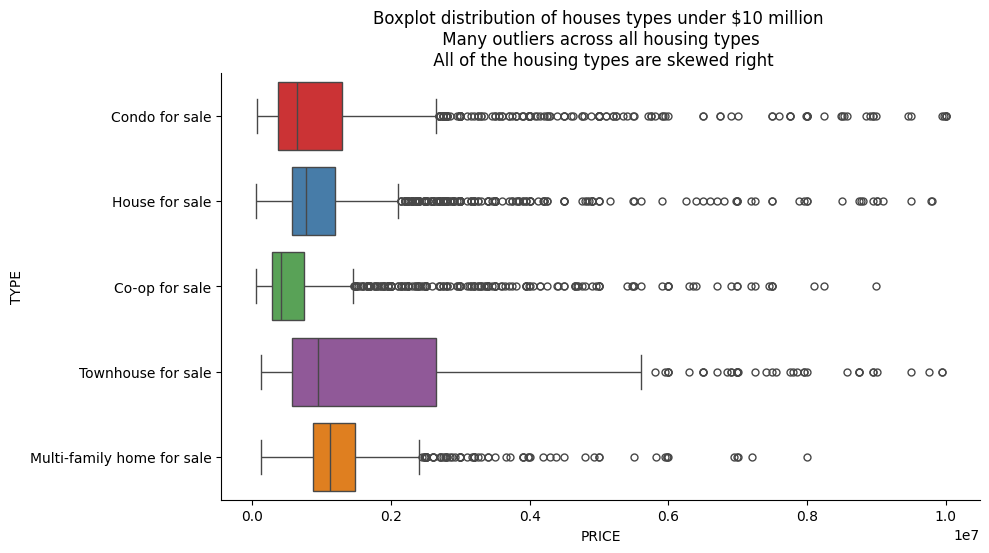

In [ ]:
sns.catplot(data = housing[housing.PRICE  < 1e7],
            y = 'TYPE',
            x = 'PRICE',
            kind = 'box',
            aspect = 2,
            palette = 'Set1');
plt.title("Boxplot distribution of houses types under $10 million \n Many outliers across all housing types \n All of the housing types are skewed right");


We can see that many of the housing types are skwewed right and have many outliers. Lets try and only visualize the houses under $5 million dollars

<ipython-input-78-4e4d848203e2>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing[housing.PRICE  < 5e6],


Text(0.5, 9.444444444444438, 'Price in millions')

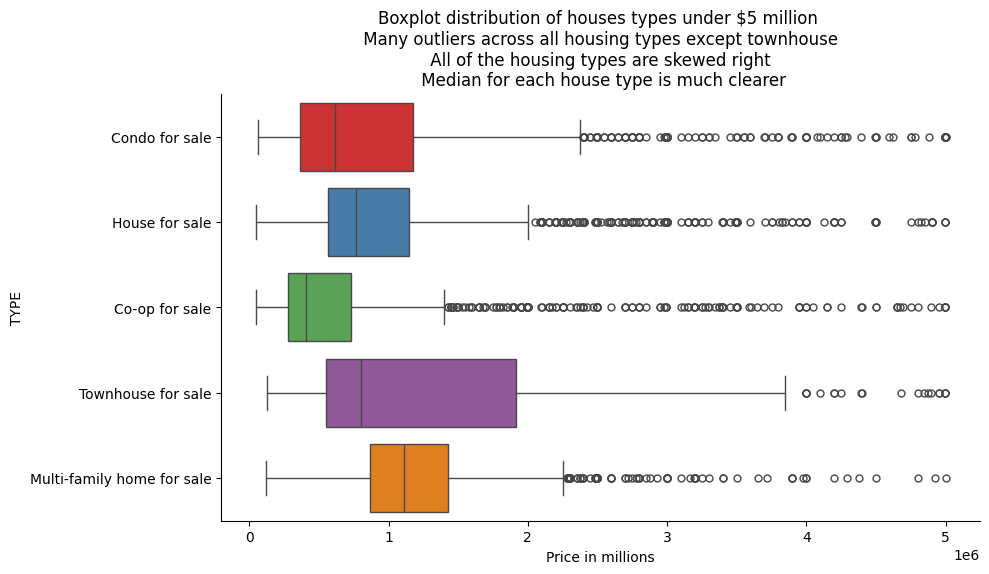

In [ ]:
sns.catplot(data = housing[housing.PRICE  < 5e6],
            y = 'TYPE',
            x = 'PRICE',
            kind = 'box',
            aspect = 2,
            palette = 'Set1');
plt.title("Boxplot distribution of houses types under $5 million \n Many outliers across all housing types except townhouse \n All of the housing types are skewed right \n Median for each house type is much clearer");
plt.xlabel("Price in millions")

With this plot we can better see the median of houses which are under $5 million

Lets take a look at the differences within each source

Text(0.5, 28.999999999999986, 'Price in millions')

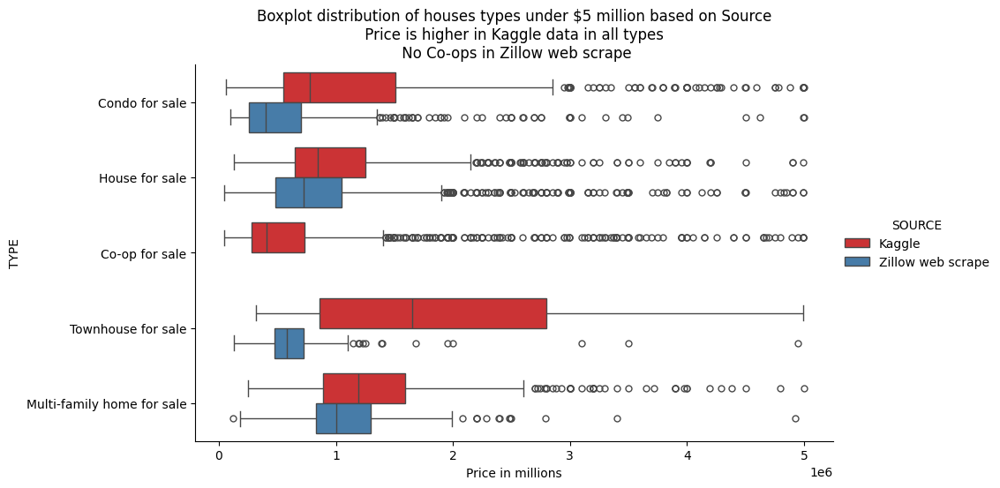

In [ ]:
sns.catplot(data = housing[housing.PRICE  < 5e6],
            y = 'TYPE',
            x = 'PRICE',
            kind = 'box',
            aspect = 2,
            palette = 'Set1',
            hue = 'SOURCE');
plt.title("Boxplot distribution of houses types under $5 million based on Source\n Price is higher in Kaggle data in all types \n No Co-ops in Zillow web scrape");
plt.xlabel("Price in millions")

<ipython-input-80-c9349ad89377>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing[housing.PRICE  < 5e6],


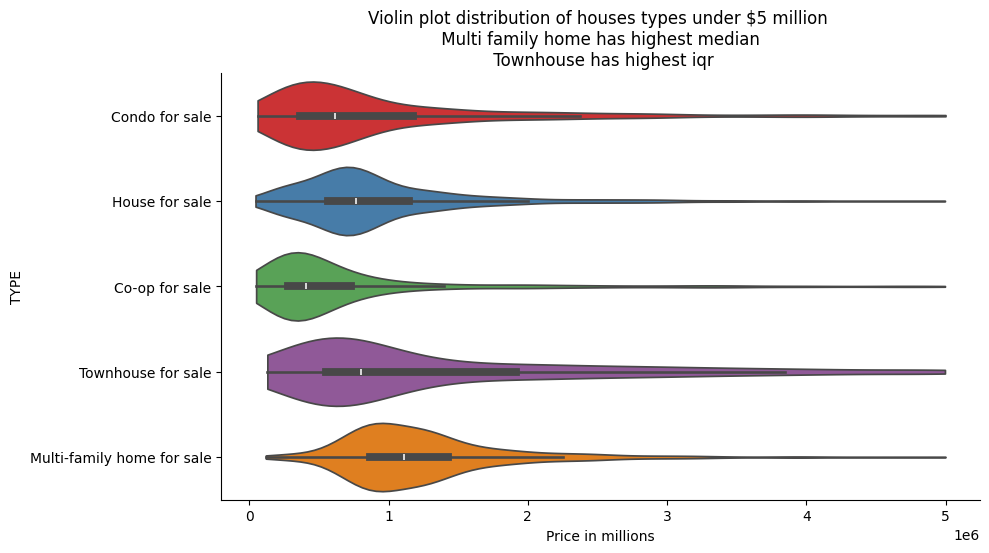

In [ ]:
sns.catplot(data = housing[housing.PRICE  < 5e6],
            y = 'TYPE',
            x = 'PRICE',
            kind = 'violin',
            aspect = 2,
            palette = 'Set1',
            cut = 0,
            );
plt.title("Violin plot distribution of houses types under $5 million \n Multi family home has highest median \n Townhouse has highest iqr");
plt.xlabel("Price in millions");

With the violin plot we can see where most of our points lie within each category.

<ipython-input-81-f8e40b625091>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = average_price_type,


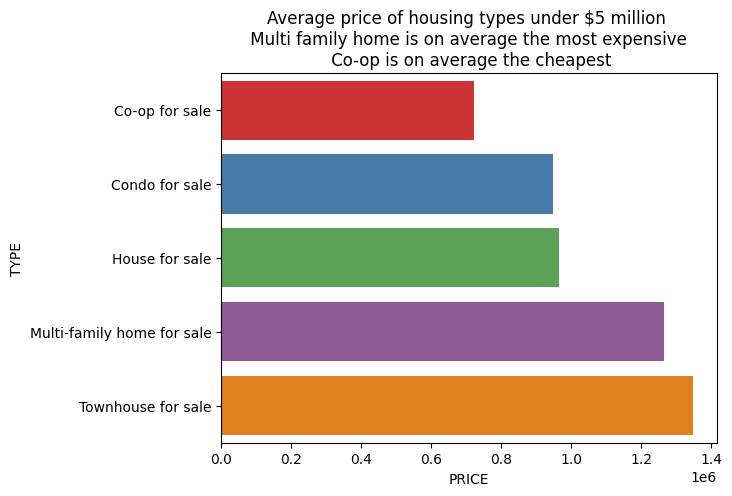

In [ ]:
average_price_type = housing[housing.PRICE < 5e6].groupby("TYPE")['PRICE'].mean().reset_index()
sns.barplot(data = average_price_type,
            y= 'TYPE',
            x = 'PRICE',
            palette = 'Set1');
plt.title("Average price of housing types under $5 million \n Multi family home is on average the most expensive \n Co-op is on average the cheapest");

We can see that multi family homes are on average the most expensive.

<ipython-input-82-0e8081cfa267>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = housing[housing.PRICE  < 5e6],


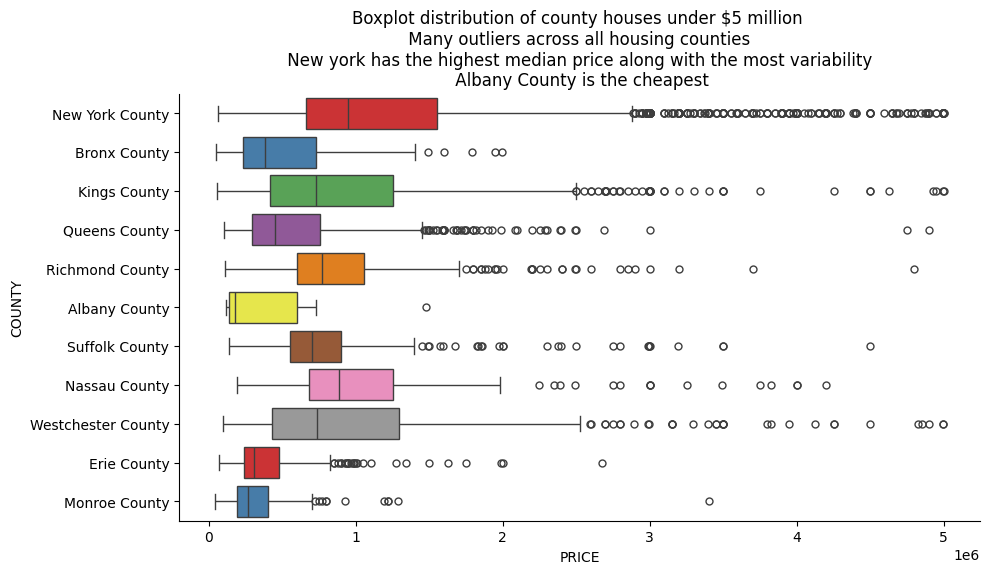

In [ ]:
sns.catplot(data = housing[housing.PRICE  < 5e6],
            y = 'COUNTY',
            x = 'PRICE',
            kind = 'box',
            aspect = 2,
            palette = 'Set1');
plt.title("Boxplot distribution of county houses under $5 million \n Many outliers across all housing counties \n New york has the highest median price along with the most variability \n Albany County is the cheapest");

We can clear see from this boxplot that new york county houses are typically more expensive and have more variability in their house prices.

<ipython-input-83-66739c840db6>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = average_price_locality,


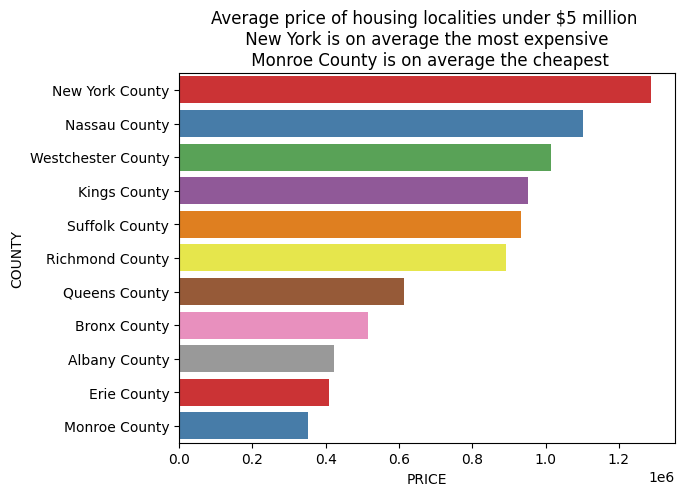

In [ ]:
average_price_locality = housing[housing.PRICE < 5e6].groupby("COUNTY")['PRICE'].mean().reset_index().sort_values(by='PRICE', ascending=False)
sns.barplot(data = average_price_locality,
            y= 'COUNTY',
            x = 'PRICE',
            palette = 'Set1');
plt.title("Average price of housing localities under $5 million \n New York is on average the most expensive \n Monroe County is on average the cheapest");

:The bar plot shows the average house price given the county. New York county is the most expensive while monroe county is the cheapest

# Handling outliers:

Afte our initial exploration of some of our variables, we are going to deal with some outliers from our numerical variables. As evident from our first relationship plot, we have very clear outliers with a house price above $2 billion and some properties with square feet exceeding 30,000. These seems more like user errors and only make up 4 rows so we will first remove those then use IQR to remove our real outliers

In [ ]:
housing = housing[(housing['PRICE'] < 2e9) & (housing['PROPERTYSQFT'] < 30000)]

In [ ]:

q1 = housing['PRICE'].quantile(0.25)
q3 = housing['PRICE'].quantile(0.75)
iqr = q3-q1

upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)

#removing
housing = housing[(housing['PRICE'] >= lower_limit) & (housing['PRICE'] <= upper_limit)]

In [ ]:

q1 = housing['PROPERTYSQFT'].quantile(0.25)
q3 = housing['PROPERTYSQFT'].quantile(0.75)
iqr = q3-q1

upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)


housing = housing[(housing['PROPERTYSQFT'] >= lower_limit) & (housing['PROPERTYSQFT'] <= upper_limit)]

In [ ]:

q1 = housing['BEDS'].quantile(0.25)
q3 = housing['BEDS'].quantile(0.75)
iqr = q3-q1

upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)


housing = housing[(housing['BEDS'] >= lower_limit) & (housing['BEDS'] <= upper_limit)]

In [ ]:

q1 = housing['BEDS'].quantile(0.25)
q3 = housing['BEDS'].quantile(0.75)
iqr = q3-q1

upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)

housing = housing[(housing['BEDS'] >= lower_limit) & (housing['BEDS'] <= upper_limit)]

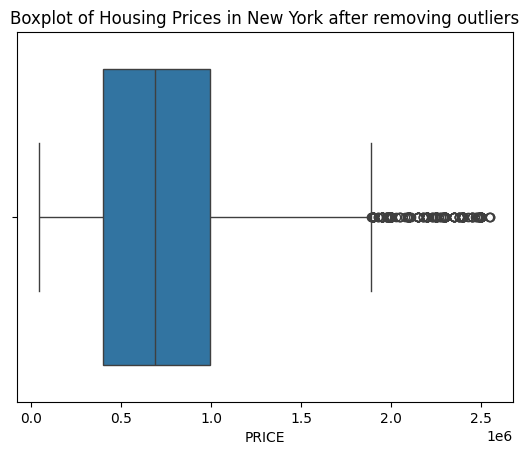

In [ ]:

sns.boxplot(data = housing,
            x = 'PRICE');
plt.title("Boxplot of Housing Prices in New York after removing outliers");


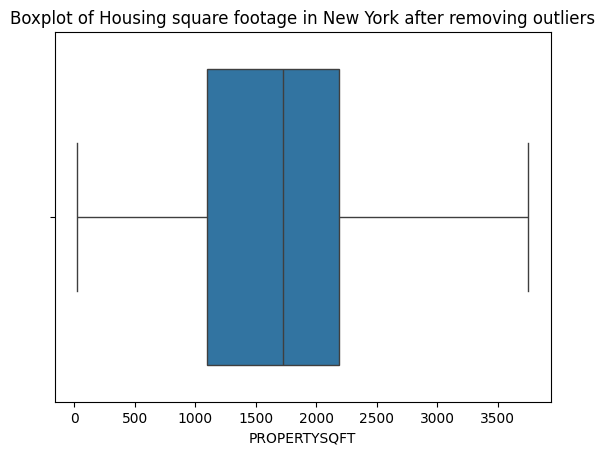

In [ ]:

sns.boxplot(data = housing,
            x = 'PROPERTYSQFT');
plt.title("Boxplot of Housing square footage in New York after removing outliers");


Text(0.5, 1.0, 'Correlation Matrix between Numerical Variables \n Beds, Baths, Property sqft, and Longtitude are all positively correlated to price \n Latitude is negatively correlated with price')

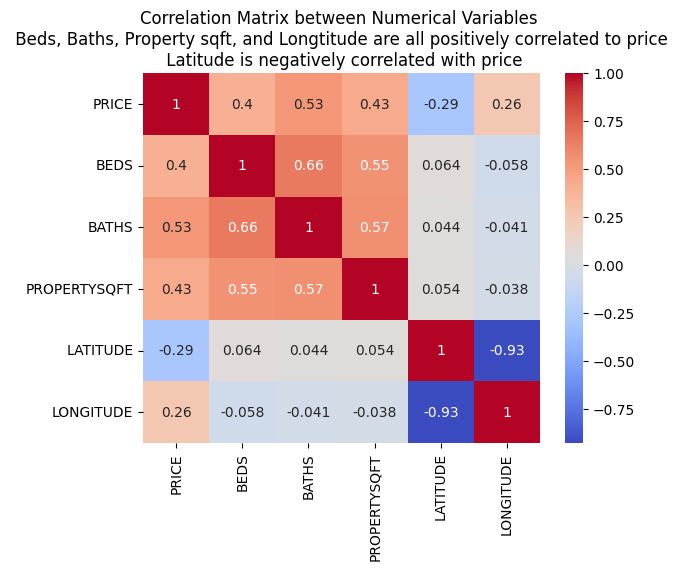

In [ ]:
numeric = housing.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = housing[numeric].corr()

sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm')
plt.title('Correlation Matrix between Numerical Variables \n Beds, Baths, Property sqft, and Longtitude are all positively correlated to price \n Latitude is negatively correlated with price')


We can see that all of our numerical variables have strong correlations with price so we will keep all of them to use in our model

##Import the necessary tools for the Machine Learning Model

In [ ]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

##Selecting Relevant Features

The features list contains the names of the features (independent variables) we want to use for predicting housing prices. Features includes number of bedrooms, bathroms, square feet.

In [ ]:
features = ['BEDS', 'BATHS', 'PROPERTYSQFT', 'LATITUDE', 'LONGITUDE']
target = ['PRICE']

## Encode categorical variables

Categorical variables like 'LOCALITY', 'SUBLOCALITY', and 'TYPE' need to be converted into numerial format for the machine learning model to understand them. Label encoding is applied here to convert labels into numerical labels

In [ ]:
housing = pd.get_dummies(housing, columns=['COUNTY'], drop_first=True)

##Create Feature and Target Arrays
X contains the feature values and y contains the target values. These arrays are extracted from the DataFrame housing using hte feature and target column names

In [ ]:
X = housing[features].values
y = housing[target].values

##Training and Testing Sets

The dataset is divided into training and testing sets using the 'train_test_split()' function from the scikit-learn. The training set is used to train the model, while the testing set is used to evaluate its performance. Here, 80% of the data is used for training ('X_train', 'y_train') and 20% for testing ('X_test', 'y_test')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)

##Feature Scaling

Feature scaling is performed to ensure that all feautures have the same scale. This helps algorithms converge faster and prevens certain features from dominating others. The StandardScaler() from scikit-learn is used to standardize the features by removing the mean and scaling to unit variance

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

##Define Model Architecture

The model architecture is defined using Sequential from TensorFlow's Keras API. This is a feedforward neural network with 3 layers:


1.   Layer 1 is a dense layer with 64 units and ReLU activation function. The input shape is determined by the number of features ('X_train_scaled.shapep[1]')
2.   Layer 2 is another dense layer with 32 units and RelU activation function
3.   Output Lyaer has one unit which predicts the housing price







In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1)
])

## Compile the model

The model is compiled using the Adam optimizer and mean squared error loss function

In [ ]:
model.compile(optimizer='adam', loss='mean_squared_error')

## Train the model

The model is trained on the training data for 50 epochs with a batch size of 32. validation_split is set at 0.2 which means 20% of the training data is used for validation during training

In [ ]:
history = model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
117/117 [==============================] - 2s 7ms/step - loss: 834232975360.0000 - val_loss: 917929918464.0000
Epoch 2/50
117/117 [==============================] - 1s 6ms/step - loss: 834068742144.0000 - val_loss: 917565538304.0000
Epoch 3/50
117/117 [==============================] - 0s 4ms/step - loss: 833417248768.0000 - val_loss: 916474888192.0000
Epoch 4/50
117/117 [==============================] - 1s 4ms/step - loss: 831885410304.0000 - val_loss: 914263769088.0000
Epoch 5/50
117/117 [==============================] - 0s 4ms/step - loss: 829129424896.0000 - val_loss: 910590214144.0000
Epoch 6/50
117/117 [==============================] - 1s 5ms/step - loss: 824876728320.0000 - val_loss: 905203482624.0000
Epoch 7/50
117/117 [==============================] - 0s 4ms/step - loss: 818933858304.0000 - val_loss: 897954676736.0000
Epoch 8/50
117/117 [==============================] - 1s 5ms/step - loss: 811086118912.0000 - val_loss: 888583880704.0000
Epoch 9/50
117/117 [====

## Evaluate the model

In [ ]:
loss = model.evaluate(X_test_scaled, y_test)
print("Test Loss: ", loss)

37/37 [==============================] - 0s 1ms/step - loss: 174275346432.0000
Test Loss:  174275346432.0


In [ ]:
import numpy as np

In [ ]:
predictions = model.predict(X_test_scaled)

errors = abs(predictions.flatten() - y_test.flatten())

mape = 100 * np.mean(errors / y_test.flatten())
accuracy = 100 - mape

print(f"Test accuracy: {accuracy:.2f}%")

37/37 [==============================] - 0s 1ms/step
Test accuracy: 44.94%


#Support Vector Regression Model

In [ ]:
from sklearn.svm import SVR

svr = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svr.fit(X_train_scaled, y_train)

y_pred_svr = svr.predict(X_test_scaled)

accuracy_svr = svr.score(X_test_scaled, y_test)
accuracy_svr = accuracy_svr * 100

print(f"Accuracy: {accuracy_svr}%")

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 4.906687701738754%


#Gradient Boosting Regression

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
gbr.fit(X_train_scaled, y_train)

y_pred_gbr = gbr.predict(X_test_scaled)

accuracy_gbr = gbr.score(X_test_scaled, y_test)
accuracy_gbr = accuracy_gbr * 100

print(f"Accuracy: {accuracy_gbr}%")

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 71.55127076576491%


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score

gbr = GradientBoostingRegressor()

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

# Perform Grid Search to find the best hyperparameters
grid_search = GridSearchCV(gbr, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the GBR model with the best hyperparameters
best_gbr = GradientBoostingRegressor(**best_params)
best_gbr.fit(X_train_scaled, y_train)

# feature selection
selector = SelectFromModel(best_gbr, threshold='median')
selector.fit(X_train_scaled, y_train)
X_train_selected = selector.transform(X_train_scaled)
X_test_selected = selector.transform(X_test_scaled)

# Train the GBR model with selected features
best_gbr_selected = GradientBoostingRegressor(**best_params)
best_gbr_selected.fit(X_train_selected, y_train)

y_pred_selected = best_gbr_selected.predict(X_test_selected)
r2 = r2_score(y_test, y_pred_selected)
r2_perc = r2 * 100
print(f"Accuracy: {r2_perc}%")


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
 

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 64.66414505217077%
